In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from huggingface_hub import login
login()

In [1]:
from data_utils import SIFT50MDataset
import os
from datasets import load_dataset, Dataset

sift_dataset = load_dataset(
    'amazon-agi/SIFT-50M',
    name='closed_ended_comparison',
    split='train',
    trust_remote_code=True
)
sift_dataset = sift_dataset.shuffle(seed=90)
df = sift_dataset.select(range(2000)).to_pandas()
print(len(sift_dataset))
allowed_values = ["common_voice_de", "common_voice_en",'vctk_en'] # "multilingual_librispeech_de" The datasets were taking too long to get donwloaded so I restricted it to certain subsets

filtered_df = df[df["data_source"].isin(allowed_values)]

# Count number of entries per value
counts = filtered_df["data_source"].value_counts()
print(counts)
sift_data = Dataset.from_pandas(filtered_df)
# Define the base datasets paths (replace with your actual paths)


Resolving data files:   0%|          | 0/1780 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/364 [00:00<?, ?it/s]

3613791
data_source
common_voice_en    279
common_voice_de    114
vctk_en             13
Name: count, dtype: int64


In [2]:
total_len = len(sift_data)
eval_len = int(0.2*total_len)

eval_ds = sift_data.select(range(eval_len))
train_ds = sift_data.select(range(eval_len,total_len))


In [3]:
import os

# Create the data directory if it doesn't exist
os.makedirs("./data", exist_ok=True)

base_datasets_root = "/home/jovyan/.cache/huggingface/datasets"
base_datasets_paths = {
    "common_voice_de": None, # No longer needs a path, handled by load_dataset
    #"multilingual_librispeech_de": None, # No longer needs a path, handled by load_dataset
    "common_voice_en": None, # No longer needs a path, handled by load_dataset
    "vctk_en": "./vctk_corpus" # VCTK still needs a root path for torchaudio
}

# Create an instance of the SIFT50MDataset
sift_iterable_dataset_train = SIFT50MDataset(sift_dataset=train_ds, base_datasets_paths=base_datasets_paths)
sift_iterable_dataset_eval = SIFT50MDataset(sift_dataset=eval_ds, base_datasets_paths=base_datasets_paths)


common_voice_de None
common_voice_en None
vctk_en ./vctk_corpus
common_voice_de None
common_voice_en None
vctk_en ./vctk_corpus


In [5]:
count = 0
for _ in sift_iterable_dataset_eval:
    count += 1
print(f"The number of files in the dataset is: {count}")

The number of files in the dataset is: 81


In [10]:
example = next(iter(sift_iterable_dataset_eval))
print(example.keys())


dict_keys(['audio_path', 'metadata'])


# Clean Audio

In [17]:
import random
from IPython.display import Audio

# Take a few random samples from the eval dataset
num_samples = 3
samples = []
for i, example in enumerate(sift_iterable_dataset_eval):
    samples.append(example)
    if len(samples) >= num_samples:
        break

# Display the samples as audio
for idx, sample in enumerate(samples):
    waveform = sample["audio_path"]
    sampling_rate = sample.get("sampling_rate", 16000)  # default 16kHz if missing
    
    print(f"Sample {idx+1}:")
    display(Audio(waveform, rate=sampling_rate))


Sample 1:


Sample 2:


Sample 3:


# Noise Audio

In [16]:
from datasets import load_dataset
from IPython.display import Audio

# Load MUSAN noise dataset in streaming mode
dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)

# Iterate over 3 samples
for idx, example in enumerate(dataset.take(3)):
    audio_dict = example["audio"]  # this is a dict
    waveform = audio_dict["array"] # numpy array
    sampling_rate = audio_dict["sampling_rate"] # e.g., 16000
    
    print(f"Sample {idx+1}:")
    display(Audio(waveform, rate=sampling_rate))


Resolving data files:   0%|          | 0/930 [00:00<?, ?it/s]

Sample 1:


Sample 2:


Sample 3:


# Added noise for one sample

Clean Audio:


Noisy Audio @ 0 dB SNR:


Noisy Audio @ 10 dB SNR:


Noisy Audio @ 20 dB SNR:


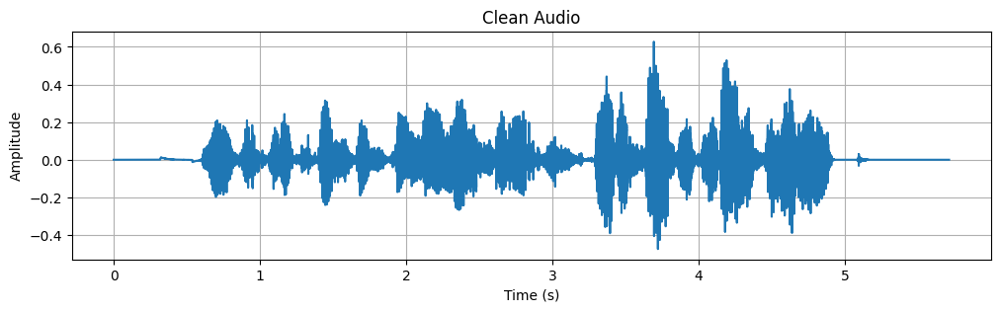

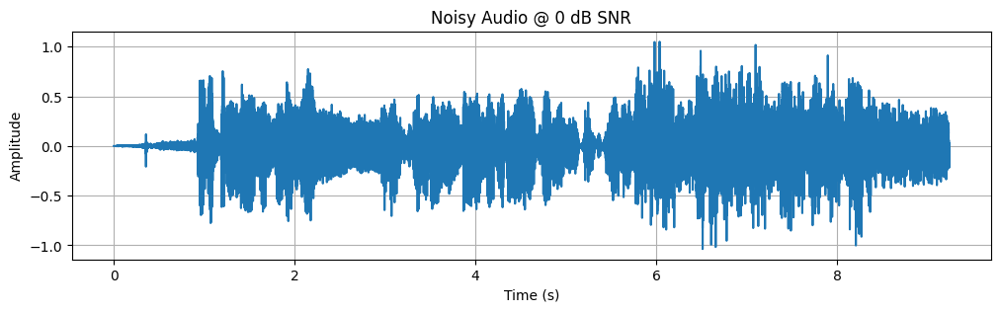

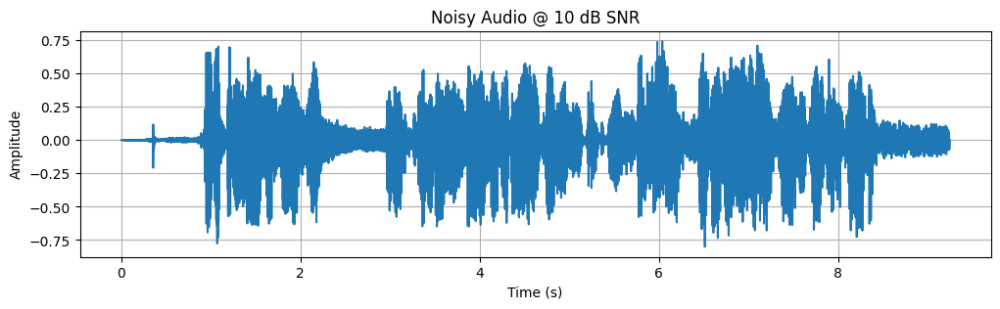

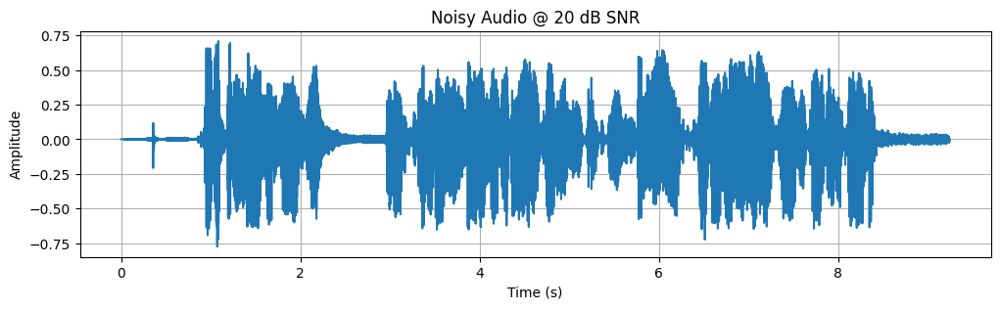

In [39]:
import torch
import torchaudio
import torchaudio.functional as F
from IPython.display import Audio

# ----------------------
# Load clean sample
# ----------------------
clean_sample = next(iter(sift_iterable_dataset_eval))
speech, sr = torchaudio.load(clean_sample["audio_path"])
if speech.size(0) > 1:
    speech = torch.mean(speech, dim=0, keepdim=True)

# ----------------------
# Load noise sample
# ----------------------
noise_sample = next(iter(dataset))
noise_waveform = torch.tensor(noise_sample["audio"]["array"], dtype=torch.float32).unsqueeze(0)
noise_sr = noise_sample["audio"]["sampling_rate"]  # if it's a path, otherwise tensor
if noise_sr != sr:
    resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
    noise = resampler(noise_waveform)

# Truncate or pad noise to match speech length
noise = noise[:, :speech.size(1)]

# SNRs and adding noise
# Reference: https://docs.pytorch.org/audio/main/tutorials/
# audio_data_augmentation_tutorial.html#adding-background-noise
snr_dbs = torch.tensor([0, 10, 20])  # multiple SNRs
noisy_speeches = F.add_noise(speech, noise, snr_dbs)  # shape: [num_snrs, 1, T]

# ----------------------
# Listen to noisy audios
# ----------------------
print("Clean Audio:")
display(Audio(speech.squeeze().numpy(), rate=sr))

for i, snr in enumerate(snr_dbs):
    print(f"Noisy Audio @ {snr} dB SNR:")
    display(Audio(noisy_speeches[i].squeeze().numpy(), rate=sr))

def plot_waveform(waveform, sr, title="Waveform"):
    waveform = waveform.squeeze().numpy()
    time_axis = np.arange(len(waveform)) / sr
    plt.figure(figsize=(12, 3))
    plt.plot(time_axis, waveform)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.show()

# ----------------------
# Step 6: Plot waveforms
# ----------------------
# Clean audio
plot_waveform(clean_waveform, clean_sr, title="Clean Audio")

# Noisy audios at different SNR levels
for snr, noisy in noisy_samples.items():
    plot_waveform(noisy, clean_sr, title=f"Noisy Audio @ {snr} dB SNR")

# Added noise for full dataset

In [42]:
import os
import torch
import torchaudio
import torchaudio.functional as F
from tqdm import tqdm
from datasets import load_dataset

# ----------------------
# Output directory
# ----------------------
output_dir = "./data/noisy_audio"
os.makedirs(output_dir, exist_ok=True)

# SNR levels
snr_levels = torch.tensor([0, 10, 20])

# ----------------------
# Load noise dataset (streaming)
# ----------------------
noise_dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)
noise_iter = iter(noise_dataset)  # iterator for picking noise

# ----------------------
# Process clean dataset
# ----------------------
for idx, clean_sample in enumerate(tqdm(sift_iterable_dataset_eval, desc="Processing clean samples")):

    # Load clean audio
    speech, sr = torchaudio.load(clean_sample["audio_path"])
    if speech.size(0) > 1:
        speech = torch.mean(speech, dim=0, keepdim=True)  # convert to mono

    # Save clean audio
    clean_filename = os.path.join(output_dir, f"sample_{idx}_clean.wav")
    torchaudio.save(clean_filename, speech, sr)

    # ----------------------
    # Pick one noise sample
    # ----------------------
    noise_sample = next(noise_iter)
    if isinstance(noise_sample["audio"], str):  # path
        noise, noise_sr = torchaudio.load(noise_sample["audio"])
    else:  # streaming array
        noise_array = noise_sample["audio"]["array"]
        noise_sr = noise_sample["audio"]["sampling_rate"]
        noise = torch.tensor(noise_array, dtype=torch.float32).unsqueeze(0)

    # Resample noise if needed
    if noise_sr != sr:
        resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
        noise = resampler(noise)
        noise_sr = sr

    # Truncate or repeat noise to match speech length
    speech_len = speech.size(1)
    noise_len = noise.size(1)
    if noise_len < speech_len:
        repeat_factor = (speech_len // noise_len) + 1
        noise = noise.repeat(1, repeat_factor)
    noise = noise[:, :speech_len]  # exact match

    # ----------------------
    # Add noise at multiple SNRs
    # ----------------------
    noisy_speeches = F.add_noise(speech, noise, snr_levels)  # shape: [num_snrs, channels, time]

    # ----------------------
    # Save noisy audios
    # ----------------------
    for i, snr in enumerate(snr_levels):
        noisy = noisy_speeches[i]
        if noisy.dim() == 1:
            noisy = noisy.unsqueeze(0)
        noisy = noisy.to(torch.float32)
        noisy_filename = os.path.join(output_dir, f"sample_{idx}_noisy_{snr}dB.wav")
        torchaudio.save(noisy_filename, noisy, sr, channels_first=True)


Resolving data files:   0%|          | 0/930 [00:00<?, ?it/s]

Processing clean samples: 81it [00:28,  2.88it/s]


# Random Noise vs Clean Audio Samples for verification

In [44]:
import random
from IPython.display import Audio, display
import torchaudio

# Directory where your clean + noisy audios are saved
output_dir = "./data/noisy_audio"

# List all saved WAV files
all_files = [f for f in os.listdir(output_dir) if f.endswith(".wav")]

# Pick 5 random samples
sample_files = random.sample(all_files, 5)

for f in sample_files:
    file_path = os.path.join(output_dir, f)
    waveform, sr = torchaudio.load(file_path)
    print(f"Playing: {f} | Sample rate: {sr} Hz")
    display(Audio(waveform.squeeze().numpy(), rate=sr))

Playing: sample_75_noisy_20dB.wav | Sample rate: 48000 Hz


Playing: sample_55_noisy_10dB.wav | Sample rate: 48000 Hz


Playing: sample_42_noisy_20dB.wav | Sample rate: 48000 Hz


Playing: sample_80_clean.wav | Sample rate: 48000 Hz


Playing: sample_4_noisy_0dB.wav | Sample rate: 32000 Hz


In [45]:
import os
import torch
from transformers import Qwen2AudioProcessor, Qwen2AudioForConditionalGeneration
from IPython.display import display, Audio

# Load processor and model
processor = Qwen2AudioProcessor.from_pretrained("Qwen/Qwen2-Audio-7B-Instruct")
model = Qwen2AudioForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2-Audio-7B-Instruct",
    device_map="auto",      # automatically choose GPU if available
    torch_dtype=torch.float16  # use FP16 for efficiency
)
model.eval()


`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Qwen2AudioForConditionalGeneration(
  (audio_tower): Qwen2AudioEncoder(
    (conv1): Conv1d(128, 1280, kernel_size=(3,), stride=(1,), padding=(1,))
    (conv2): Conv1d(1280, 1280, kernel_size=(3,), stride=(2,), padding=(1,))
    (embed_positions): Embedding(1500, 1280)
    (layers): ModuleList(
      (0-31): 32 x Qwen2AudioEncoderLayer(
        (self_attn): Qwen2AudioAttention(
          (k_proj): Linear(in_features=1280, out_features=1280, bias=False)
          (v_proj): Linear(in_features=1280, out_features=1280, bias=True)
          (q_proj): Linear(in_features=1280, out_features=1280, bias=True)
          (out_proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (self_attn_layer_norm): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
        (activation_fn): GELUActivation()
        (fc1): Linear(in_features=1280, out_features=5120, bias=True)
        (fc2): Linear(in_features=5120, out_features=1280, bias=True)
        (final_layer_norm): LayerNorm

In [46]:
import torchaudio

def load_audio(file_path, target_sr=16000):
    waveform, sr = torchaudio.load(file_path)
    
    # Convert to mono if stereo
    if waveform.size(0) > 1:
        waveform = torch.mean(waveform, dim=0, keepdim=True)
    
    # Resample if needed
    if sr != target_sr:
        resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
        waveform = resampler(waveform)
        sr = target_sr
        
    return waveform.squeeze(), sr


In [47]:
def transcribe_audio(file_path):
    waveform, sr = load_audio(file_path)
    
    # Processor expects numpy array
    input_values = processor(waveform.numpy(), sampling_rate=sr, return_tensors="pt").input_values
    
    # Move to model device
    input_values = input_values.to(model.device)
    
    # Generate transcription
    with torch.no_grad():
        generated_ids = model.generate(input_values)
    
    transcription = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return transcription


In [48]:
import os
from IPython.display import Audio, display
import torchaudio
import random

output_dir = "./data/noisy_audio"
all_files = [f for f in os.listdir(output_dir) if f.endswith(".wav")]

# pick 5 random files (mix of clean + noisy)
sample_files = random.sample(all_files, 5)

for f in sample_files:
    file_path = os.path.join(output_dir, f)
    waveform, sr = torchaudio.load(file_path)
    print(f"Playing: {f} | Sample rate: {sr} Hz")
    display(Audio(waveform.squeeze().numpy(), rate=sr))


Playing: sample_57_noisy_0dB.wav | Sample rate: 32000 Hz


/home/jovyan/.local/opt/conda/envs/my_env/lib/python3.11/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/home/jovyan/.local/opt/conda/envs/my_env/lib/python3.11/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.co

Playing: sample_21_noisy_0dB.wav | Sample rate: 48000 Hz


Playing: sample_34_clean.wav | Sample rate: 48000 Hz


Playing: sample_36_noisy_0dB.wav | Sample rate: 48000 Hz


Playing: sample_0_clean.wav | Sample rate: 48000 Hz
